In [1]:
%pip install tensorflow-cpu==2.6.*

     |████████████████████████████████| 172.4 MB 23 kB/s s eta 0:00:01
  Using cached keras-2.6.0-py2.py3-none-any.whl (1.3 MB)
     |████████████████████████████████| 4.3 MB 62.6 MB/s eta 0:00:01
  Using cached tensorflow_estimator-2.6.0-py2.py3-none-any.whl (462 kB)
  Using cached clang-5.0.tar.gz (30 kB)
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30705 sha256=2a8873e501d65e46f334e459d8f32f25a1294f96a9e912a050395cae6c4ff656
  Stored in directory: /home/azureuser/.cache/pip/wheels/f1/60/77/22b9b5887bd47801796a856f47650d9789c74dc3161a26d608
Successfully built clang
  Attempting uninstall: grpcio
    Found existing installation: grpcio 1.34.1
    Uninstalling grpcio-1.34.1:
      Successfully uninstalled grpcio-1.34.1
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.5.0
    Uninstalling tensorflow-estimator-2.5.0:
      Successfully uninstalled tensorflow-estimator-2.5.0
ERROR: After October 2020 you may experi

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.callbacks import ModelCheckpoint

In [2]:
print (tf.__version__)

2.5.0


In [3]:
pwd

'/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/Arshak'

In [4]:
# data_dir='/content/drive/MyDrive/train/Untitled folder'

data_dir='/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new'

In [5]:
import pathlib
data_dir = pathlib.Path(data_dir)

In [6]:
print(data_dir)
for name in data_dir.glob('*/*.jpeg'):
    print(name)

/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new/cattle/cattle_1.jpeg
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new/cattle/cattle_10.jpeg
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new/cattle/cattle_100.jpeg
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new/cattle/cattle_101.jpeg
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new/cattle/cattle_102.jpeg
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new/cattle/cattle_103.jpeg
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/simple_images_new/cattle/cattle_104.jpeg
/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/co

In [7]:
image_count = len(list(data_dir.glob('*/*.jpeg')))
print(image_count)

1378


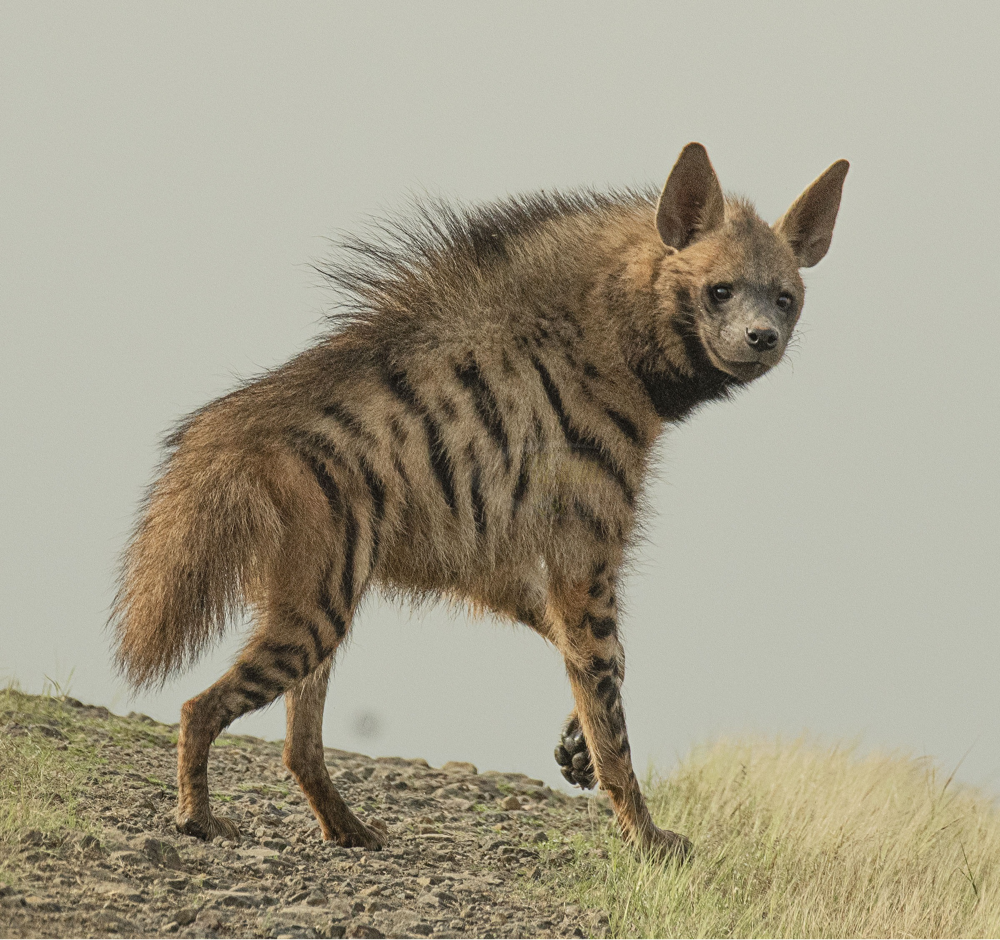

In [8]:
Hyena = list(data_dir.glob('hyena/*'))
PIL.Image.open(str(Hyena[2]))

In [9]:
batch_size = 32
img_height = 180
img_width = 180

In [10]:
tf.keras.preprocessing.image_dataset_from_directory

<function tensorflow.python.keras.preprocessing.image_dataset.image_dataset_from_directory(directory, labels='inferred', label_mode='int', class_names=None, color_mode='rgb', batch_size=32, image_size=(256, 256), shuffle=True, seed=None, validation_split=None, subset=None, interpolation='bilinear', follow_links=False, smart_resize=False)>

In [11]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1416 files belonging to 7 classes.
Using 1133 files for training.


In [12]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1416 files belonging to 7 classes.
Using 283 files for validation.


In [13]:
class_names = train_ds.class_names
print(class_names)

['cattle', 'horse', 'hyena', 'leopard', 'lion', 'tiger', 'wolf']


In [14]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [15]:
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [16]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
#the pixels values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [17]:
data_augmentation = Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(img_height, img_width, 3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)

In [18]:
data_aug_ds = train_ds.map(lambda x,y: (data_augmentation(x),y))

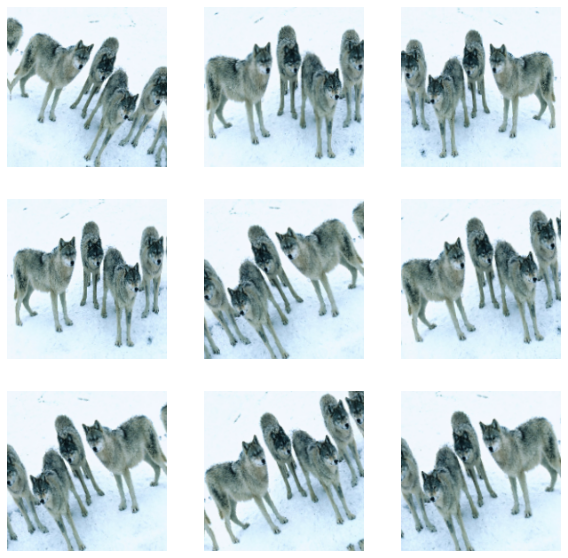

In [19]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense


class VGGNet:
    @staticmethod
    def build(width, height, depth, classes):
        # Initialize model and input shape
        model = Sequential()
        inputShape = (height, width, depth)
        channelDimension = -1

        # Block1: CONV => RELU => CONV => RELU => POOL layer set
        model.add(Conv2D(32, (3, 3), padding="same", input_shape=inputShape))
        model.add(Activation("relu"))
        model.add(BatchNormalization(axis=channelDimension))
        model.add(Conv2D(32, (3, 3), padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(axis=channelDimension))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Dropout(0.25))

        # Block2: CONV => RELU => CONV => RELU => POOL layer set
        model.add(Conv2D(64, (3, 3), padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(axis=channelDimension))
        model.add(Conv2D(64, (3, 3), padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(axis=channelDimension))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Dropout(0.25))

        # Block3: CONV => RELU => CONV => RELU => POOL layer set
        model.add(Conv2D(64, (3, 3), padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(axis=channelDimension))
        model.add(Conv2D(64, (3, 3), padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(axis=channelDimension))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Dropout(0.25))

        # First set of FC => RELU layers
        model.add(Flatten())
        model.add(Dense(256))
        model.add(Activation("relu"))
        model.add(BatchNormalization())
        model.add(Dropout(0.4))

        # Softmax classifier
        model.add(Dense(classes))
        model.add(Activation("softmax"))

        # Return the model
        return model


In [21]:
a=VGGNet

In [22]:
model=a.build(img_width ,img_height,3,10)


In [23]:
opt = Adam(learning_rate=0.01)
model.compile(optimizer=opt,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [24]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 180, 180, 32)      896       
_________________________________________________________________
activation (Activation)      (None, 180, 180, 32)      0         
_________________________________________________________________
batch_normalization (BatchNo (None, 180, 180, 32)      128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 180, 180, 32)      9248      
_________________________________________________________________
activation_1 (Activation)    (None, 180, 180, 32)      0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 180, 180, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 90, 90, 32)       

In [27]:
checkpoint = ModelCheckpoint("/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/Vggnet.hdf5", monitor="val_accuracy", save_best_only=True, verbose=1)
callbacks = [checkpoint]

In [26]:
# H = model.fit_generator(aug.flow(trainX, trainY, batch_size=32), validation_data=(testX, testY),
#                         steps_per_epoch=len(trainX) // 32, epochs=40, callbacks=callbacks, verbose=1)

In [28]:
epochs=40
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks,verbose=2
)

Epoch 1/40
36/36 - 99s - loss: 1.4031 - accuracy: 0.5587 - val_loss: 49.9691 - val_accuracy: 0.1802

Epoch 00001: val_accuracy improved from -inf to 0.18021, saving model to /mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/Vggnet.hdf5
Epoch 2/40
36/36 - 99s - loss: 0.8730 - accuracy: 0.7034 - val_loss: 25.1332 - val_accuracy: 0.2155

Epoch 00002: val_accuracy improved from 0.18021 to 0.21555, saving model to /mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/Vggnet.hdf5
Epoch 3/40
36/36 - 101s - loss: 0.6025 - accuracy: 0.7988 - val_loss: 4.8490 - val_accuracy: 0.3463

Epoch 00003: val_accuracy improved from 0.21555 to 0.34629, saving model to /mnt/batch/tasks/shared/LS_root/mounts/clusters/arshak1/code/Users/dixitadvait4/Vggnet.hdf5
Epoch 4/40
36/36 - 97s - loss: 0.4678 - accuracy: 0.8341 - val_loss: 1.6902 - val_accuracy: 0.4876

Epoch 00004: val_accuracy improved from 0.34629 to 0.48763, saving model to /mnt/batch/tasks/sha

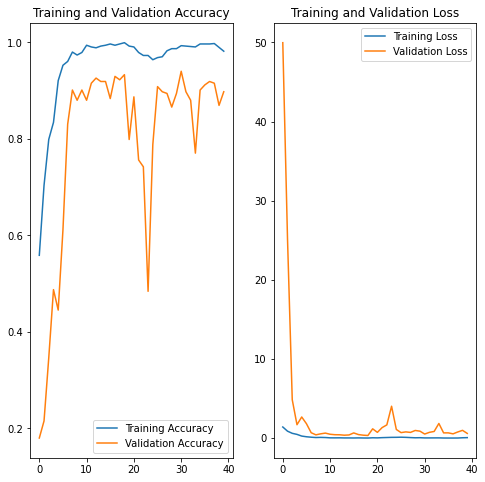

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [29]:
print("Accuracy : ",acc)

Accuracy :  [0.3884444534778595, 0.656000018119812, 0.8062222003936768, 0.8257777690887451, 0.8666666746139526, 0.9306666851043701, 0.9626666903495789, 0.9804444313049316, 0.9875555634498596, 0.9546666741371155, 0.9626666903495789, 0.9644444584846497, 0.9893333315849304, 0.9911110997200012, 0.9937777519226074, 0.9982222318649292, 0.995555579662323, 0.9964444637298584, 0.9991111159324646, 0.9991111159324646, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


In [34]:
acc[17]

0.9964444637298584

In [30]:
print("Validation_Accuracy : ",val_acc)

Validation_Accuracy :  [0.3772242069244385, 0.5480427145957947, 0.6690391302108765, 0.5160142183303833, 0.8007117509841919, 0.918149471282959, 0.9217081665992737, 0.9395017623901367, 0.8505337834358215, 0.8932384252548218, 0.754448413848877, 0.8790035843849182, 0.9217081665992737, 0.9466192126274109, 0.9501779079437256, 0.9572953581809998, 0.9608541131019592, 0.9679715037345886, 0.9608541131019592, 0.9572953581809998, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9572953581809998, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592, 0.9608541131019592]


In [37]:
val_acc[17]

0.9679715037345886

In [31]:
print("Loss : ", loss)

Loss :  [2.1452367305755615, 1.0827804803848267, 0.658941924571991, 0.6279096603393555, 0.3820822238922119, 0.20106250047683716, 0.11249688267707825, 0.06083805859088898, 0.04924958571791649, 0.13840363919734955, 0.10374360531568527, 0.10675693303346634, 0.049137182533741, 0.03160032257437706, 0.021181251853704453, 0.011113783344626427, 0.019217941910028458, 0.012417205609381199, 0.0067582991905510426, 0.005325295962393284, 0.0026778101455420256, 0.0017413015011698008, 0.0025379087310284376, 0.001318578259088099, 0.0012733510229736567, 0.0013909511035308242, 0.001191234914585948, 0.00117923179641366, 0.000997019000351429, 0.0007190866163000464, 0.0008108966867439449, 0.0006936916033737361, 0.0005342886433936656, 0.0005045673460699618, 0.0010041245259344578, 0.0007151017198339105, 0.0006053848192095757, 0.0004866757954005152, 0.00046926000504754484, 0.0004070145369041711]


In [38]:
loss[17]

0.012417205609381199

In [32]:
print("Validation Loss : ", val_loss)

Validation Loss :  [1.9236817359924316, 1.43972647190094, 1.182856559753418, 2.08271861076355, 0.7246561050415039, 0.3284474313259125, 0.3131416141986847, 0.3024848997592926, 0.7060908675193787, 0.41629934310913086, 0.9835867285728455, 0.5692346096038818, 0.4575323462486267, 0.2915555238723755, 0.3078624904155731, 0.2781611680984497, 0.2943306863307953, 0.29780635237693787, 0.3069559633731842, 0.31725019216537476, 0.30298081040382385, 0.29264599084854126, 0.30897629261016846, 0.3116096258163452, 0.3096301555633545, 0.3094985783100128, 0.31679779291152954, 0.29844895005226135, 0.3015075922012329, 0.3014315366744995, 0.308630108833313, 0.3138478696346283, 0.31310543417930603, 0.3121446967124939, 0.3118385672569275, 0.3106611669063568, 0.3182218670845032, 0.31793421506881714, 0.31658220291137695, 0.3160531520843506]


In [39]:
val_loss[17]

0.29780635237693787

In [41]:
model = load_model("/mnt/batch/tasks/shared/LS_root/mounts/clusters/arshakshan1/code/Users/arshakshan/Vggnet.hdf5")